In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/testdataset/TestDataSet/labels_list.json
/kaggle/input/testdataset/TestDataSet/n02769748/n02769748_10044.JPEG
/kaggle/input/testdataset/TestDataSet/n02769748/n02769748_10023.JPEG
/kaggle/input/testdataset/TestDataSet/n02769748/n02769748_10043.JPEG
/kaggle/input/testdataset/TestDataSet/n02769748/n02769748_100708.JPEG
/kaggle/input/testdataset/TestDataSet/n02769748/n02769748_101083.JPEG
/kaggle/input/testdataset/TestDataSet/n02966687/n02966687_10014.JPEG
/kaggle/input/testdataset/TestDataSet/n02966687/n02966687_10019.JPEG
/kaggle/input/testdataset/TestDataSet/n02966687/n02966687_10017.JPEG
/kaggle/input/testdataset/TestDataSet/n02966687/n02966687_10002.JPEG
/kaggle/input/testdataset/TestDataSet/n02966687/n02966687_10009.JPEG
/kaggle/input/testdataset/TestDataSet/n02730930/n02730930_100.JPEG
/kaggle/input/testdataset/TestDataSet/n02730930/n02730930_1004.JPEG
/kaggle/input/testdataset/TestDataSet/n02730930/n02730930_1016.JPEG
/kaggle/input/testdataset/TestDataSet/n02730930/n0

In [2]:
import json
import torch
from torchvision import models, transforms, datasets
from tqdm import tqdm
import os
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset


In [3]:
# Force model re-download to match expected output
import shutil
import os

# 1. Clear PyTorch model cache
cache_dir = "/root/.cache/torch/hub/checkpoints/"
if os.path.exists(cache_dir):
    print(f"Clearing PyTorch model cache at {cache_dir}")
    # Remove specific ResNet-34 model file
    resnet_file = os.path.join(cache_dir, "resnet34-b627a593.pth")
    if os.path.exists(resnet_file):
        os.remove(resnet_file)
        print(f"Removed cached ResNet-34 model")
    else:
        print("ResNet-34 model not found in cache")

# Now run the original evaluation code which will download the model again
# Device
import torch
import torchvision
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import json
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Transforms
plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])
# Paths
data_root = "/kaggle/input/testdataset/TestDataSet"
json_path = f"{data_root}/labels_list.json"
# 1) Load JSON list of strings
with open(json_path, "r") as f:
    labels_list = json.load(f)
# 2) Build a map from ImageFolder's folder-index → true ImageNet index
folder_index_to_imagenet = {
    idx: int(entry.split(":",1)[0]) for idx, entry in enumerate(labels_list)
}
# 3) Prepare Dataset + DataLoader
dataset = datasets.ImageFolder(root=data_root, transform=plain_transforms)
loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=4)
# 4) Load ResNet-34 - this will force a download
model = models.resnet34(weights="IMAGENET1K_V1").to(device).eval()
# 5) Evaluate
top1 = top5 = total = 0
for images, folder_labels in tqdm(loader, desc="Eval"):
    images = images.to(device)
    out = model(images)
    
    # map to the true labels
    true = torch.tensor(
        [folder_index_to_imagenet[int(fl)] for fl in folder_labels],
        device=device
    )
    
    # top-1
    _, p1 = out.topk(1, dim=1)
    p1 = p1.view(-1)
    top1 += (p1 == true).sum().item()
    
    # top-5
    _, p5 = out.topk(5, dim=1)
    top5 += (p5 == true.view(-1,1)).sum().item()
    
    total += images.size(0)
print(f"Total images: {total}")
print(f"Top-1 Acc: {top1/total*100:.2f}%")
print(f"Top-5 Acc: {top5/total*100:.2f}%")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 177MB/s] 
Eval: 100%|██████████| 16/16 [00:03<00:00,  5.19it/s]

Total images: 500
Top-1 Acc: 76.00%
Top-5 Acc: 94.20%


Successfully loaded 100 class mappings from JSON
Loading pre-trained ResNet-34 model...
Generating adversarial examples with FGSM...


Processing batches: 100%|██████████| 16/16 [00:04<00:00,  3.65it/s]



Results Summary:
Clean accuracy     - Top-1: 76.00%, Top-5: 94.20%
Adversarial accuracy - Top-1: 3.40%, Top-5: 21.20%
Maximum perturbation (L∞ norm): 0.0200  (target: ≤ 0.02)
Saved adversarial dataset to /kaggle/working/AdversarialTestSet1.pt
Finding examples where adversarial attack succeeded...
Creating visualization...


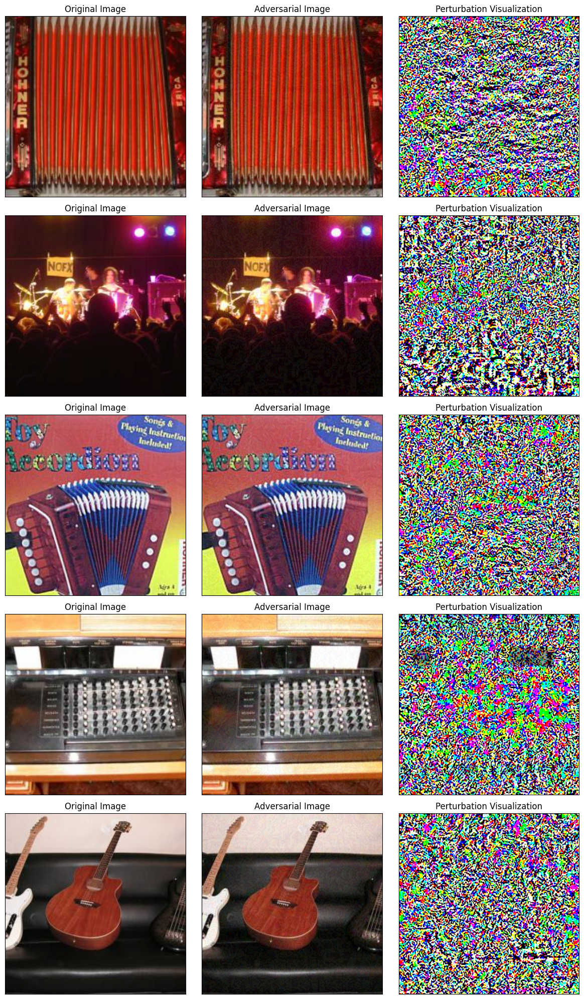

In [4]:
# Adversarial Example Generation with FGSM
import os
import json
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms, models

# Configuration settings
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_DIRECTORY = "/kaggle/input/testdataset/TestDataSet"
LABELS_FILE = os.path.join(DATA_DIRECTORY, "labels_list.json")
PERTURBATION_MAGNITUDE = 0.02  # Epsilon value for FGSM

# Define image transformations
transform_to_tensor = transforms.ToTensor()
normalize_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
denormalize_transform = transforms.Compose([
    transforms.Normalize([0, 0, 0], [1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize([-0.485, -0.456, -0.406], [1, 1, 1])
])

# Create class ID mapping
class_mapping = {}
try:
    # First attempt: Load from JSON file
    with open(LABELS_FILE, "r") as file:
        label_entries = json.load(file)
    class_mapping = {idx: int(entry.split(":", 1)[0]) for idx, entry in enumerate(label_entries)}
    print(f"Successfully loaded {len(class_mapping)} class mappings from JSON")
except Exception as error:
    print(f"JSON loading failed: {error}")
    # Alternative approach: Create mapping from dataset structure
    print("Creating mapping from dataset folder structure")
    temp_dataset = datasets.ImageFolder(root=DATA_DIRECTORY)
    for idx, (path, _) in enumerate(temp_dataset.samples):
        folder_name = os.path.basename(os.path.dirname(path))
        class_idx = temp_dataset.class_to_idx[folder_name]
        if folder_name.startswith('n'):
            # Extract ImageNet ID for folders starting with 'n'
            class_mapping[class_idx] = int(folder_name[1:])
        else:
            # Otherwise use class index directly
            class_mapping[class_idx] = class_idx

# Load datasets with different transforms
raw_dataset = datasets.ImageFolder(root=DATA_DIRECTORY, transform=transform_to_tensor)
normalized_dataset = datasets.ImageFolder(root=DATA_DIRECTORY, transform=normalize_transform)

# Create data loaders
batch_size = 32
raw_loader = DataLoader(raw_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
normalized_loader = DataLoader(normalized_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

# Initialize and load pre-trained model
print("Loading pre-trained ResNet-34 model...")
resnet_model = models.resnet34(weights="IMAGENET1K_V1").to(device)
resnet_model.eval()  # Set to evaluation mode

# Constants for normalization/denormalization
normalization_std = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
normalization_mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)

# Storage for adversarial examples
adversarial_images = []
adversarial_labels = []

# Performance tracking metrics
clean_top1_correct = clean_top5_correct = 0
adv_top1_correct = adv_top5_correct = 0
total_images = 0
max_perturbation = 0.0

# Generate adversarial examples using FGSM
print("Generating adversarial examples with FGSM...")
for (norm_batch, folder_labels), (raw_batch, _) in tqdm(zip(normalized_loader, raw_loader), 
                                                       total=len(normalized_loader), 
                                                       desc="Processing batches"):
    # Move data to device
    norm_batch = norm_batch.to(device).requires_grad_(True)
    raw_batch = raw_batch.to(device)
    
    # Convert dataset labels to ImageNet class IDs
    try:
        true_labels = torch.tensor([class_mapping[int(label)] for label in folder_labels], device=device)
    except KeyError:
        # Fallback if mapping fails
        true_labels = folder_labels.to(device)

    # Evaluate model on clean images
    clean_outputs = resnet_model(norm_batch)
    
    # Calculate top-1 and top-5 accuracy for clean images
    _, top1_preds = clean_outputs.topk(1, dim=1)
    top1_preds = top1_preds.view(-1)
    _, top5_preds = clean_outputs.topk(5, dim=1)
    
    clean_top1_correct += (top1_preds == true_labels).sum().item()
    clean_top5_correct += (top5_preds == true_labels.view(-1, 1)).sum().item()

    # Calculate loss and gradients for FGSM
    loss = torch.nn.functional.cross_entropy(clean_outputs, true_labels)
    resnet_model.zero_grad()
    loss.backward()
    input_gradients = norm_batch.grad.sign()
    
    # Apply perturbation in raw pixel space
    perturbed_images_raw = torch.clamp(
        raw_batch + PERTURBATION_MAGNITUDE * input_gradients,
        min=0.0, max=1.0
    )
    
    # Calculate maximum perturbation
    batch_perturbation = (perturbed_images_raw - raw_batch).abs().reshape(raw_batch.size(0), -1).max(dim=1)[0]
    max_perturbation = max(max_perturbation, batch_perturbation.max().item())

    # Convert perturbed images back to normalized form for model input
    perturbed_images_norm = (perturbed_images_raw - normalization_mean) / normalization_std
    
    # Store adversarial examples
    adversarial_images.append(perturbed_images_norm.detach().cpu())
    adversarial_labels.extend(true_labels.cpu().tolist())

    # Evaluate model on adversarial images
    adv_outputs = resnet_model(perturbed_images_norm)
    _, adv_top1_preds = adv_outputs.topk(1, dim=1)
    adv_top1_preds = adv_top1_preds.view(-1)
    _, adv_top5_preds = adv_outputs.topk(5, dim=1)
    
    adv_top1_correct += (adv_top1_preds == true_labels).sum().item()
    adv_top5_correct += (adv_top5_preds == true_labels.view(-1, 1)).sum().item()
    
    total_images += norm_batch.size(0)

# Combine all adversarial images
all_adversarial_images = torch.cat(adversarial_images, dim=0)

# Report results
print("\nResults Summary:")
print(f"Clean accuracy     - Top-1: {clean_top1_correct/total_images*100:.2f}%, Top-5: {clean_top5_correct/total_images*100:.2f}%")
print(f"Adversarial accuracy - Top-1: {adv_top1_correct/total_images*100:.2f}%, Top-5: {adv_top5_correct/total_images*100:.2f}%")
print(f"Maximum perturbation (L∞ norm): {max_perturbation:.4f}  (target: ≤ {PERTURBATION_MAGNITUDE})")

# Save adversarial dataset
output_dataset = TensorDataset(all_adversarial_images, torch.tensor(adversarial_labels))
output_path = "/kaggle/working/AdversarialTestSet1.pt"
torch.save(output_dataset, output_path)
print(f"Saved adversarial dataset to {output_path}")

# Find examples where the attack succeeded (model prediction changed)
failed_indices = []
print("Finding examples where adversarial attack succeeded...")
with torch.no_grad():
    for idx, (adv_image, true_label) in enumerate(zip(all_adversarial_images, adversarial_labels)):
        # Get prediction on adversarial image
        model_input = adv_image.unsqueeze(0).to(device)
        prediction = resnet_model(model_input).argmax(dim=1).item()
        
        # If prediction doesn't match true label, attack succeeded
        if prediction != true_label:
            failed_indices.append(idx)
            if len(failed_indices) >= 5:
                break

# If fewer than 5 failures found, add images until we have 5
if len(failed_indices) < 5:
    remaining = 5 - len(failed_indices)
    print(f"Only {len(failed_indices)} failures found. Adding {remaining} more examples.")
    for i in range(min(remaining, len(all_adversarial_images) - len(failed_indices))):
        failed_indices.append(len(failed_indices) + i)

# Visualize original vs adversarial images and perturbation maps
print("Creating visualization...")
fig, axes = plt.subplots(5, 3, figsize=(12, 20))

for row, idx in enumerate(failed_indices[:5]):
    # Get original and adversarial images
    orig_norm, _ = normalized_dataset[idx]
    adv_norm = all_adversarial_images[idx]
    
    # Convert to displayable format by denormalizing
    orig_display = denormalize_transform(orig_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    adv_display = denormalize_transform(adv_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    
    # Calculate and normalize perturbation for visualization
    perturbation = adv_display - orig_display
    perturbation_min, perturbation_max = perturbation.min(), perturbation.max()
    perturbation_viz = (perturbation - perturbation_min) / (perturbation_max - perturbation_min + 1e-8)
    
    # Display images
    axes[row, 0].imshow(orig_display)
    axes[row, 0].set_title("Original Image")
    axes[row, 1].imshow(adv_display)
    axes[row, 1].set_title("Adversarial Image")
    axes[row, 2].imshow(perturbation_viz)
    axes[row, 2].set_title("Perturbation Visualization")
    
    # Remove axis ticks
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

Loaded 100 class mappings from JSON
Loading ResNet-34...


PGD & Eval: 100%|██████████| 16/16 [00:24<00:00,  1.51s/it]


Baseline   Top-1: 76.00%, Top-5: 94.20%
PGD Attack Top-1: 0.00%, Top-5: 2.20%
Max raw‐pixel L∞: 0.0200  (≤ 0.02)
Saved AdversarialTestSet2.pt to /kaggle/working


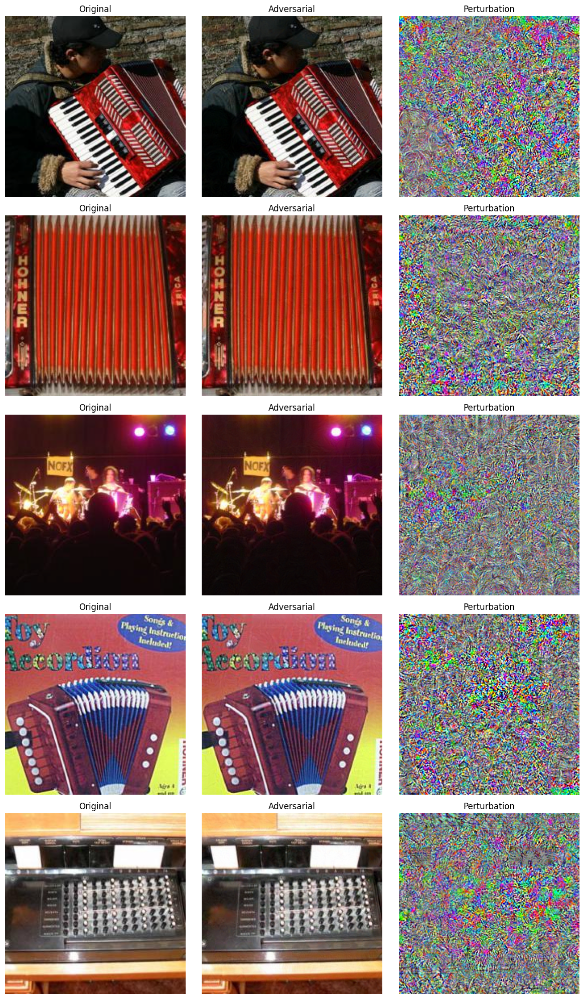

In [5]:
# Task 3: PGD Implementation (Improved Attack)
import os
import json
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms, models

# 1) Config
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_ROOT = "/kaggle/input/testdataset/TestDataSet"  # Updated to match your notebook
JSON_PATH = os.path.join(DATA_ROOT, "labels_list.json")
EPSILON = 0.02    # L∞ budget in raw [0–1] space
ALPHA = 0.002     # step size (usually ε/10)
STEPS = 10        # number of PGD iterations

# 2) Transforms
to_tensor = transforms.ToTensor()
plain_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])
inv_tf = transforms.Compose([
    transforms.Normalize(mean=[0.0, 0.0, 0.0],
                       std=[1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                       std=[1.0, 1.0, 1.0])
])

# 3) Load label mapping
try:
    with open(JSON_PATH, "r") as f:
        entries = json.load(f)
    folder_to_im = {i: int(e.split(":", 1)[0]) for i, e in enumerate(entries)}
    print(f"Loaded {len(folder_to_im)} class mappings from JSON")
except Exception as e:
    print(f"Error loading JSON: {e}")
    # Create mapping from dataset
    print("Creating class mapping from dataset")
    tmp_ds = datasets.ImageFolder(root=DATA_ROOT)
    folder_to_im = {}
    for idx, (folder_name, _) in enumerate(tmp_ds.samples):
        class_idx = tmp_ds.class_to_idx[os.path.basename(os.path.dirname(folder_name))]
        if os.path.basename(os.path.dirname(folder_name)).startswith('n'):
            # If folder name starts with 'n', extract ImageNet ID
            folder_to_im[class_idx] = int(os.path.basename(os.path.dirname(folder_name))[1:])
        else:
            # Otherwise use the class index
            folder_to_im[class_idx] = class_idx
    print(f"Created {len(folder_to_im)} class mappings from dataset")

# 4) DataLoaders: raw and normalized
ds_raw = datasets.ImageFolder(root=DATA_ROOT, transform=to_tensor)
ds_norm = datasets.ImageFolder(root=DATA_ROOT, transform=plain_tf)
loader_raw = DataLoader(ds_raw, batch_size=32, shuffle=False, num_workers=2)  # Reduced to 2
loader_norm = DataLoader(ds_norm, batch_size=32, shuffle=False, num_workers=2)  # Reduced to 2

# 5) Load ResNet-34
print("Loading ResNet-34...")
model = models.resnet34(weights="IMAGENET1K_V1").to(DEVICE).eval()

# 6) PGD attack
adv_tensors, adv_labels = [], []
top1_orig = top5_orig = top1_adv = top5_adv = total = 0
max_raw_delta = 0.0

for (x_norm, lbls), (x_raw, _) in tqdm(zip(loader_norm, loader_raw),
                                      desc="PGD & Eval", total=len(loader_norm)):
    x_norm = x_norm.to(DEVICE).requires_grad_(True)
    x_raw = x_raw.to(DEVICE)
    
    # Convert folder labels to ImageNet IDs
    try:
        true = torch.tensor([folder_to_im[int(l)] for l in lbls], device=DEVICE)
    except KeyError:
        # If mapping fails, use labels directly
        true = lbls.to(DEVICE)

    # — record clean accuracy
    out = model(x_norm)
    _, p1 = out.topk(1, dim=1); p1 = p1.view(-1)
    _, p5 = out.topk(5, dim=1)
    top1_orig += (p1 == true).sum().item()
    top5_orig += (p5 == true.view(-1, 1)).sum().item()

    # — initialize adversarial raw to the original
    x_adv_raw = x_raw.clone().detach()

    # — PGD loop in raw space
    for _ in range(STEPS):
        # forward on normalized adversarial
        x_adv_norm = (x_adv_raw - torch.tensor([0.485, 0.456, 0.406], device=DEVICE).view(1, 3, 1, 1)) \
                    / torch.tensor([0.229, 0.224, 0.225], device=DEVICE).view(1, 3, 1, 1)
        x_adv_norm.requires_grad_(True)
        out2 = model(x_adv_norm)
        loss = torch.nn.functional.cross_entropy(out2, true)

        model.zero_grad()
        loss.backward()
        grad = x_adv_norm.grad.data.sign()

        # step in raw space & project back into ε-ball & [0,1]
        x_adv_raw = torch.clamp(
            x_adv_raw + ALPHA * grad,
            min=x_raw - EPSILON,
            max=x_raw + EPSILON
        )
        x_adv_raw = torch.clamp(x_adv_raw, 0.0, 1.0)

    # — final normalized adversarial for eval & storage
    x_final_norm = (x_adv_raw - torch.tensor([0.485, 0.456, 0.406], device=DEVICE).view(1, 3, 1, 1)) \
                  / torch.tensor([0.229, 0.224, 0.225], device=DEVICE).view(1, 3, 1, 1)
    adv_tensors.append(x_final_norm.detach().cpu())
    adv_labels.extend(true.cpu().tolist())

    # — adversarial accuracy
    with torch.no_grad():
        out3 = model(x_final_norm)
        q1 = out3.argmax(dim=1)
        _, q5 = out3.topk(5, dim=1)
        top1_adv += (q1 == true).sum().item()
        top5_adv += (q5 == true.view(-1, 1)).sum().item()

    # — track true raw L∞
    batch_delta = (x_adv_raw - x_raw).abs().view(x_raw.size(0), -1).max(dim=1)[0]
    max_raw_delta = max(max_raw_delta, batch_delta.max().item())

    total += x_raw.size(0)

# 7) Report
adv_set = torch.cat(adv_tensors, dim=0)
print(f"Baseline   Top-1: {top1_orig/total*100:.2f}%, Top-5: {top5_orig/total*100:.2f}%")
print(f"PGD Attack Top-1: {top1_adv/total*100:.2f}%, Top-5: {top5_adv/total*100:.2f}%")
print(f"Max raw‐pixel L∞: {max_raw_delta:.4f}  (≤ {EPSILON})")

# 8) Save Adversarial Test Set 2
adv_dataset = TensorDataset(adv_set, torch.tensor(adv_labels))
torch.save(adv_dataset, "/kaggle/working/AdversarialTestSet2.pt")
print("Saved AdversarialTestSet2.pt to /kaggle/working")

# 9) Visualize 5 failures
fig, ax = plt.subplots(5, 3, figsize=(12, 20))
fails = []
with torch.no_grad():
    for i, (img_norm, true_lbl) in enumerate(zip(adv_set, adv_labels)):
        pred = model(img_norm.unsqueeze(0).to(DEVICE)).argmax(dim=1).item()
        if pred != true_lbl:
            fails.append(i)
            if len(fails) == 5:
                break

# If not enough failures found, use first 5 images
if len(fails) < 5:
    print(f"Found only {len(fails)} failures, using first {5-len(fails)} images to complete visualization")
    fails.extend(range(len(fails), min(5, len(adv_set))))

for row, idx in enumerate(fails):
    orig = ds_norm[idx][0]
    adv = adv_set[idx]
    # invert to [0,1]
    im_o = inv_tf(orig).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    im_a = inv_tf(adv).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    diff = (im_a - im_o)
    diff = (diff - diff.min())/(diff.max()-diff.min() + 1e-8)  # Add small epsilon to avoid division by zero

    ax[row, 0].imshow(im_o); ax[row, 0].set_title("Original")
    ax[row, 1].imshow(im_a); ax[row, 1].set_title("Adversarial")
    ax[row, 2].imshow(diff); ax[row, 2].set_title("Perturbation")
    for a in ax[row]: a.axis("off")

plt.tight_layout()
plt.show()

Loaded 100 class mappings from JSON
Loading ResNet-34...


Patch Attack: 100%|██████████| 32/32 [00:27<00:00,  1.14it/s]


Baseline  Top-1: 76.00%, Top-5: 94.20%
Adversarial Top-1: 74.20%, Top-5: 92.20%
Max patch perturbation (raw pixels): 0.3000  (bound: 0.3)
Saved AdversarialTestSet3.pt to /kaggle/working
Patch‐attack Top-1: 74.20%
Patch‐attack Top-5: 92.20%



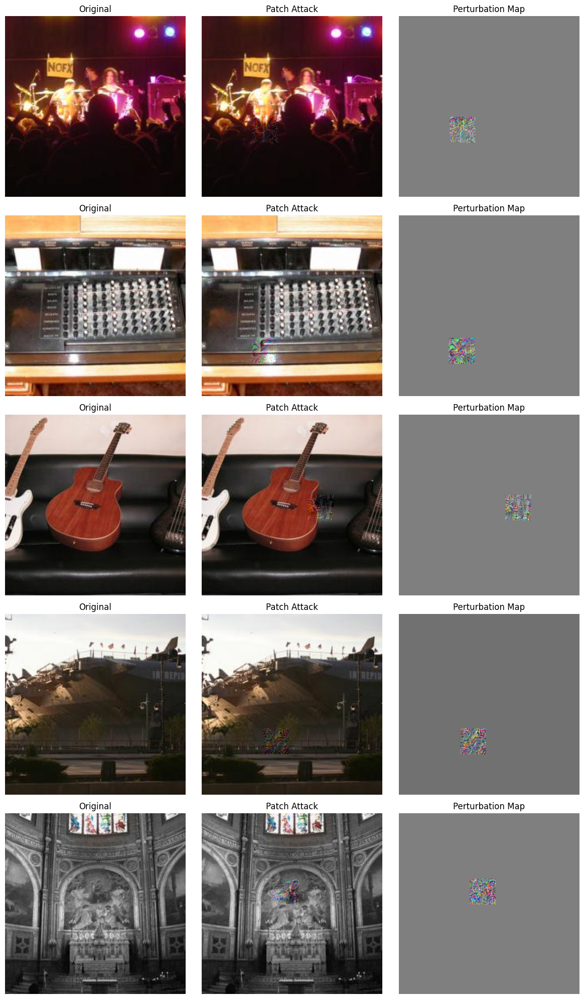

In [6]:
# Task 4: Patch Attacks
import os
import json
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.utils.data import DataLoader, TensorDataset
from torchvision import datasets, transforms, models
import random

# 1) Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_ROOT = "/kaggle/input/testdataset/TestDataSet"  # Match your notebook
JSON_PATH = os.path.join(DATA_ROOT, "labels_list.json")
EPSILON = 0.3  # Higher epsilon for patch attacks (0.3 to 0.5 recommended)
PATCH_SIZE = 32  # Size of the patch to attack

# 2) Transforms
to_tensor = transforms.ToTensor()
plain_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                       std=[0.229, 0.224, 0.225])
])
inv_tf = transforms.Compose([
    transforms.Normalize(mean=[0.0, 0.0, 0.0],
                       std=[1/0.229, 1/0.224, 1/0.225]),
    transforms.Normalize(mean=[-0.485, -0.456, -0.406],
                       std=[1.0, 1.0, 1.0])
])

# 3) Load label mapping
try:
    with open(JSON_PATH, "r") as f:
        entries = json.load(f)
    folder_to_im = {idx: int(e.split(":", 1)[0]) 
                   for idx, e in enumerate(entries)}
    print(f"Loaded {len(folder_to_im)} class mappings from JSON")
except Exception as e:
    print(f"Error loading JSON: {e}")
    # Create mapping from dataset
    print("Creating class mapping from dataset")
    tmp_ds = datasets.ImageFolder(root=DATA_ROOT)
    folder_to_im = {}
    for idx, (folder_name, _) in enumerate(tmp_ds.samples):
        class_idx = tmp_ds.class_to_idx[os.path.basename(os.path.dirname(folder_name))]
        if os.path.basename(os.path.dirname(folder_name)).startswith('n'):
            # If folder name starts with 'n', extract ImageNet ID
            folder_to_im[class_idx] = int(os.path.basename(os.path.dirname(folder_name))[1:])
        else:
            # Otherwise use the class index
            folder_to_im[class_idx] = class_idx

# 4) Prepare DataLoaders
dataset_norm = datasets.ImageFolder(root=DATA_ROOT, transform=plain_tf)
dataset_raw = datasets.ImageFolder(root=DATA_ROOT, transform=to_tensor)
loader_norm = DataLoader(dataset_norm, batch_size=16, shuffle=False, num_workers=2)
loader_raw = DataLoader(dataset_raw, batch_size=16, shuffle=False, num_workers=2)

# 5) Load model
print("Loading ResNet-34...")
model = models.resnet34(weights="IMAGENET1K_V1").to(device).eval()

# 6) Patch Attack Implementation
sigmas = torch.tensor([0.229, 0.224, 0.225], device=device).view(1, 3, 1, 1)
means = torch.tensor([0.485, 0.456, 0.406], device=device).view(1, 3, 1, 1)

adv_images = []
adv_labels = []
top1_orig = top5_orig = top1_adv = top5_adv = total = 0
max_raw_delta = 0.0

for (img_norm, folder_lbls), (img_raw, _) in tqdm(zip(loader_norm, loader_raw), 
                                               desc="Patch Attack", total=len(loader_norm)):
    img_norm = img_norm.to(device)
    img_raw = img_raw.to(device)
    
    # Convert folder labels to ImageNet IDs
    try:
        true_im = torch.tensor([folder_to_im[int(l)] for l in folder_lbls], 
                              device=device)
    except KeyError:
        # If mapping fails, use labels directly
        true_im = folder_lbls.to(device)
    
    # --- Clean evaluation
    out = model(img_norm)
    _, p1 = out.topk(1, dim=1); p1 = p1.view(-1)
    _, p5 = out.topk(5, dim=1)
    top1_orig += (p1 == true_im).sum().item()
    top5_orig += (p5 == true_im.view(-1, 1)).sum().item()
    
    # --- Create patch masks for this batch
    batch_size, _, height, width = img_norm.shape
    masks = torch.zeros_like(img_raw)
    
    for i in range(batch_size):
        # Choose random patch location
        top = random.randint(0, height - PATCH_SIZE)
        left = random.randint(0, width - PATCH_SIZE)
        
        # Set mask to 1 at patch location
        masks[i, :, top:top+PATCH_SIZE, left:left+PATCH_SIZE] = 1.0
    
    # --- Target attack (use least likely class as target)
    with torch.no_grad():
        logits = model(img_norm)
        target_labels = logits.argmin(dim=1)  # Least likely class
    
    # --- Patch attack with gradient descent (multiple steps)
    perturbed_img = img_raw.clone()
    perturbed_img.requires_grad_(True)
    
    # Perform multiple steps of targeted attack
    for _ in range(10):  # 10 iterations
        # Normalize the perturbed image
        perturbed_norm = (perturbed_img - means) / sigmas
        
        # Forward pass
        outputs = model(perturbed_norm)
        
        # Loss for targeted attack (minimize loss for target class)
        loss = -torch.nn.functional.cross_entropy(outputs, target_labels)
        
        # Backward pass
        loss.backward()
        
        # Update only the patch area with gradient
        with torch.no_grad():
            # Get gradients
            grad = perturbed_img.grad.data
            
            # Apply sign of gradients only to masked patch area
            update = EPSILON/10 * grad.sign() * masks
            
            # Update image (only within patch)
            perturbed_img.data = perturbed_img.data - update
            
            # Project back to valid image space
            perturbed_img.data = torch.clamp(perturbed_img.data, 0, 1)
            
            # Zero out gradients for next iteration
            perturbed_img.grad.zero_()
    
    # --- Track max perturbation in the masked region
    with torch.no_grad():
        # Calculate perturbation only in the masked region
        patch_diff = (perturbed_img - img_raw) * masks
        max_patch_delta = patch_diff.abs().max().item()
        max_raw_delta = max(max_raw_delta, max_patch_delta)
    
    # --- Normalize for model input
    perturbed_norm = (perturbed_img - means) / sigmas
    
    # --- Store adversarial examples
    adv_images.append(perturbed_norm.detach().cpu())
    adv_labels.extend(true_im.cpu().tolist())
    
    # --- Adversarial evaluation
    with torch.no_grad():
        out2 = model(perturbed_norm)
        _, q1 = out2.topk(1, dim=1); q1 = q1.view(-1)
        _, q5 = out2.topk(5, dim=1)
        top1_adv += (q1 == true_im).sum().item()
        top5_adv += (q5 == true_im.view(-1, 1)).sum().item()
    
    total += img_norm.size(0)

# 7) Report
adv_images = torch.cat(adv_images, dim=0)
print(f"Baseline  Top-1: {top1_orig/total*100:.2f}%, Top-5: {top5_orig/total*100:.2f}%")
print(f"Adversarial Top-1: {top1_adv/total*100:.2f}%, Top-5: {top5_adv/total*100:.2f}%")
print(f"Max patch perturbation (raw pixels): {max_raw_delta:.4f}  (bound: {EPSILON})")

# 8) Save the adversarial dataset
adv_dataset = TensorDataset(adv_images, torch.tensor(adv_labels))
torch.save(adv_dataset, '/kaggle/working/AdversarialTestSet3.pt')
print(f"Saved AdversarialTestSet3.pt to /kaggle/working")

# 9) Evaluate against the model
top1 = top5 = 0
with torch.no_grad():
    for adv_img, true_lbl in zip(adv_images, adv_labels):
        out = model(adv_img.unsqueeze(0).to(device))
        preds1 = out.argmax(dim=1).item()
        preds5 = out.topk(5, dim=1)[1].view(-1).tolist()
        top1 += int(preds1 == true_lbl)
        top5 += int(true_lbl in preds5)

total = len(adv_images)
print(f"Patch‐attack Top-1: {top1/total*100:.2f}%")
print(f"Patch‐attack Top-5: {top5/total*100:.2f}%\n")

# 10) Find failure examples for visualization
fail_idxs = []
with torch.no_grad():
    for idx, (adv_img, true_lbl) in enumerate(zip(adv_images, adv_labels)):
        if model(adv_img.unsqueeze(0).to(device)).argmax(dim=1).item() != true_lbl:
            fail_idxs.append(idx)
            if len(fail_idxs) == 5:
                break

# If not enough failures found, use first 5 images
if len(fail_idxs) < 5:
    print(f"Found only {len(fail_idxs)} failures, using first {5-len(fail_idxs)} images to complete visualization")
    fail_idxs.extend(range(len(fail_idxs), min(5, len(adv_images))))

# 11) Visualize examples
fig, axes = plt.subplots(5, 3, figsize=(12, 20))
for row, idx in enumerate(fail_idxs):
    orig_norm, _ = dataset_norm[idx]
    adv_norm = adv_images[idx]
    
    # Convert to numpy images
    orig_img = inv_tf(orig_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    adv_img = inv_tf(adv_norm).permute(1, 2, 0).clamp(0, 1).cpu().numpy()
    
    # Compute difference
    diff = adv_img - orig_img
    diff_map = (diff - diff.min()) / (diff.max() - diff.min() + 1e-8)
    
    # Plot
    axes[row, 0].imshow(orig_img)
    axes[row, 0].set_title("Original")
    axes[row, 1].imshow(adv_img)
    axes[row, 1].set_title("Patch Attack")
    axes[row, 2].imshow(diff_map, cmap='viridis')
    axes[row, 2].set_title("Perturbation Map")
    
    for ax in axes[row]:
        ax.axis("off")

plt.tight_layout()
plt.show()

Loading clean dataset...
Loading Adv Set 1 (FGSM) from /kaggle/working/AdversarialTestSet1.pt...
Loading Adv Set 2 (PGD) from /kaggle/working/AdversarialTestSet2.pt...
Loading Adv Set 3 (Patch) from /kaggle/working/AdversarialTestSet3.pt...
Loading DenseNet-121...


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 164MB/s] 


Evaluating DenseNet-121 on all four sets...

Transferability Results:
| Dataset               |   Top-1 (%) |   Top-5 (%) |
|:----------------------|------------:|------------:|
| Clean                 |         0   |         0   |
| Adv Set 1 (FGSM)      |        45.8 |        76.2 |
| Adv Set 2 (PGD)       |        47.8 |        81.4 |
| Adv Set 3 (Patch-PGD) |        74.8 |        93.2 |


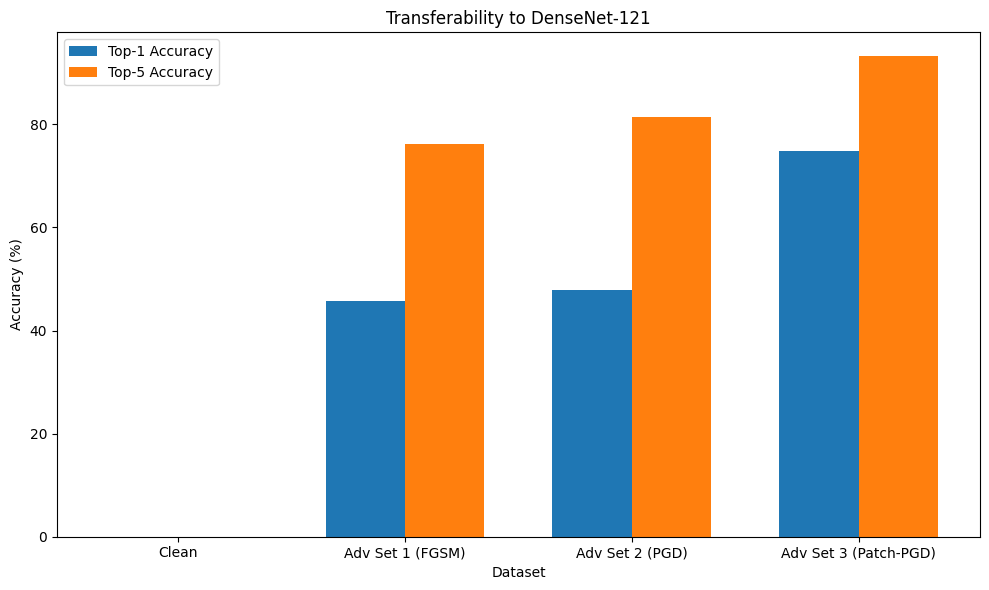

In [7]:
# Task 5 - Transferability Analysis
import torch
import torchvision
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
import pandas as pd
import matplotlib.pyplot as plt

# 1) Configuration
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DATA_ROOT = "/kaggle/input/testdataset/TestDataSet"

# Paths - updated to match your actual files
ADV1_PATH = "/kaggle/working/AdversarialTestSet1.pt"   # Note: This is the correct filename you created
ADV2_PATH = "/kaggle/working/AdversarialTestSet2.pt"
ADV3_PATH = "/kaggle/working/AdversarialTestSet3.pt"

# 2) Transforms for evaluation
eval_tf = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                        [0.229, 0.224, 0.225])
])

# 3) Load the four datasets
print("Loading clean dataset...")
clean_ds = datasets.ImageFolder(DATA_ROOT, transform=eval_tf)
clean_loader = DataLoader(clean_ds, batch_size=32, shuffle=False, num_workers=2)

print(f"Loading Adv Set 1 (FGSM) from {ADV1_PATH}...")
adv1_ds = torch.load(ADV1_PATH, weights_only=False)
adv1_loader = DataLoader(adv1_ds, batch_size=32, shuffle=False)

print(f"Loading Adv Set 2 (PGD) from {ADV2_PATH}...")
adv2_ds = torch.load(ADV2_PATH, weights_only=False)
adv2_loader = DataLoader(adv2_ds, batch_size=32, shuffle=False)

print(f"Loading Adv Set 3 (Patch) from {ADV3_PATH}...")
adv3_ds = torch.load(ADV3_PATH, weights_only=False)
adv3_loader = DataLoader(adv3_ds, batch_size=32, shuffle=False)

# 4) Load DenseNet-121
print("Loading DenseNet-121...")
model = models.densenet121(weights="IMAGENET1K_V1").to(DEVICE).eval()

# 5) Evaluation function
def eval_loader(loader):
    top1 = top5 = total = 0
    with torch.no_grad():
        for X, y in loader:
            X, y = X.to(DEVICE), y.to(DEVICE)
            out = model(X)
            # Top-1
            pred1 = out.argmax(dim=1)
            top1 += (pred1 == y).sum().item()
            # Top-5
            pred5 = out.topk(5, dim=1)[1]
            top5 += (pred5 == y.view(-1, 1)).sum().item()
            total += y.size(0)
    return top1/total*100, top5/total*100

# 6) Run evaluations
print("Evaluating DenseNet-121 on all four sets...")
clean_t1, clean_t5 = eval_loader(clean_loader)
adv1_t1, adv1_t5 = eval_loader(adv1_loader)
adv2_t1, adv2_t5 = eval_loader(adv2_loader)
adv3_t1, adv3_t5 = eval_loader(adv3_loader)

# 7) Create results table
results = pd.DataFrame({
    "Dataset": ["Clean", "Adv Set 1 (FGSM)", "Adv Set 2 (PGD)", "Adv Set 3 (Patch-PGD)"],
    "Top-1 (%)": [clean_t1, adv1_t1, adv2_t1, adv3_t1],
    "Top-5 (%)": [clean_t5, adv1_t5, adv2_t5, adv3_t5],
})
print("\nTransferability Results:")
print(results.to_markdown(index=False))

# 8) Plot results
plt.figure(figsize=(10, 6))
x = range(len(results["Dataset"]))
width = 0.35
plt.bar(x, results["Top-1 (%)"], width, label="Top-1 Accuracy")
plt.bar([i+width for i in x], results["Top-5 (%)"], width, label="Top-5 Accuracy")
plt.xlabel("Dataset")
plt.ylabel("Accuracy (%)")
plt.title("Transferability to DenseNet-121")
plt.xticks([i+width/2 for i in x], results["Dataset"])
plt.legend()
plt.tight_layout()
plt.show()